In [2]:
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp
%config InlineBackend.figure_format ='retina'

In [78]:
NSIDE = 32
print(
    "Approximate resolution at NSIDE {} is {:.2} deg".format(
        NSIDE, hp.nside2resol(NSIDE, arcmin=True) / 60
    )
)
NPIX = hp.nside2npix(NSIDE)
print(NPIX)

Approximate resolution at NSIDE 32 is 1.8 deg
12288


[1 1 1 ... 0 0 1]
The masks partition the sky
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


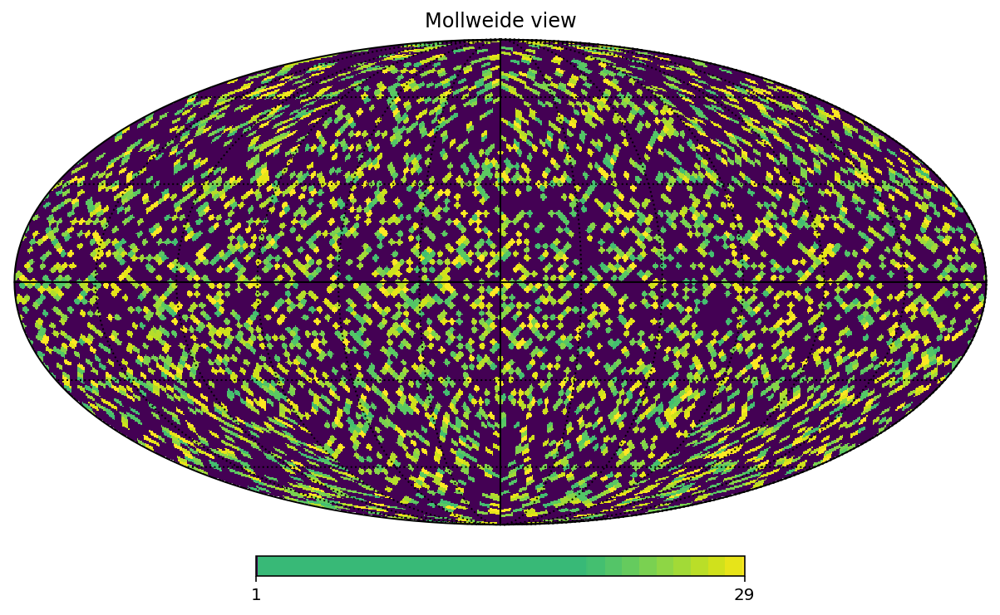

In [232]:
mask_tester = np.random.randint(0,30,NPIX)


for i in range(len(mask_tester)):
    if(mask_tester[i] < 20):
        mask1[i] = True
    else:
        mask1[i] = False

mask2 = [(not i) for i in mask1]
print(mask1)
mask_tester = hf.recombine_maps([np.ones(NPIX), mask_tester],[mask2, mask1])

hp.mollview(mask_tester, norm='hist')
hp.graticule()

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


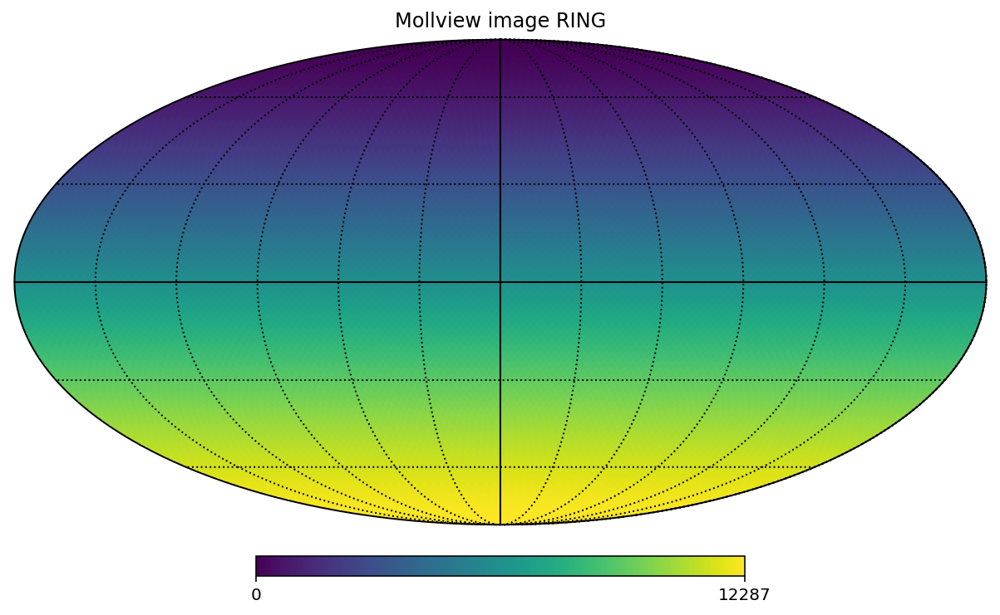

In [64]:
m = np.arange(NPIX)
hp.mollview(m, title="Mollview image RING")
hp.graticule()
%config InlineBackend.figure_format ='retina'

In [11]:
vec = hp.ang2vec(np.pi / 2, np.pi * 3 / 4)
print(vec)

[-7.07106781e-01  7.07106781e-01  6.12323400e-17]


In [12]:
ipix_disc = hp.query_disc(nside=32, vec=vec, radius=np.radians(10))

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


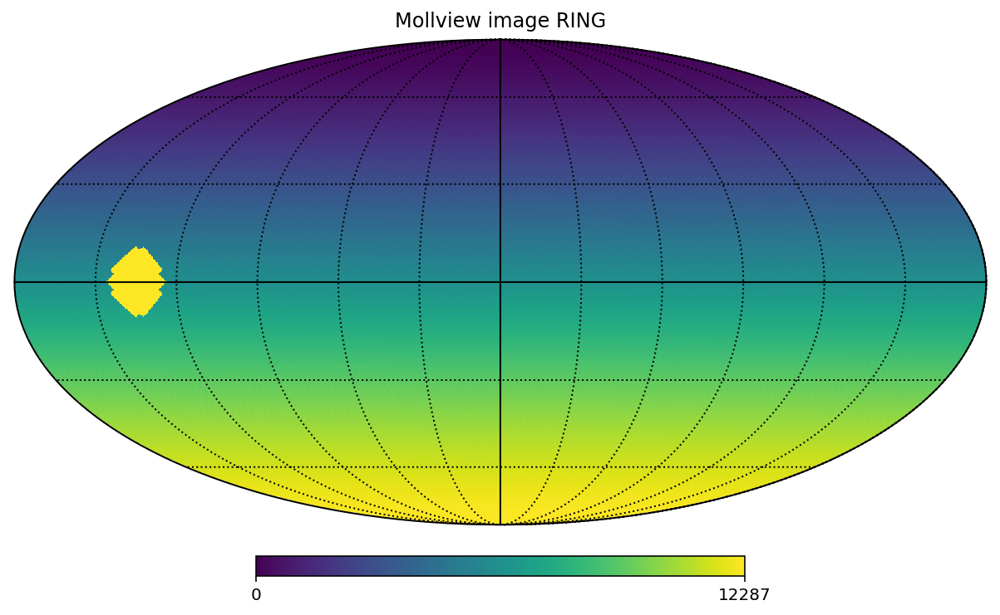

In [83]:
m = np.arange(NPIX)
m[ipix_disc] = m.max()
hp.mollview(m, title="Mollview image RING")
hp.graticule()

In [14]:
theta, phi = np.degrees(hp.pix2ang(nside=32, ipix=[0, 1, 2, 3, 4]))

In [15]:
theta

array([1.46197116, 1.46197116, 1.46197116, 1.46197116, 2.92418036])

In [16]:
phi

array([ 45. , 135. , 225. , 315. ,  22.5])

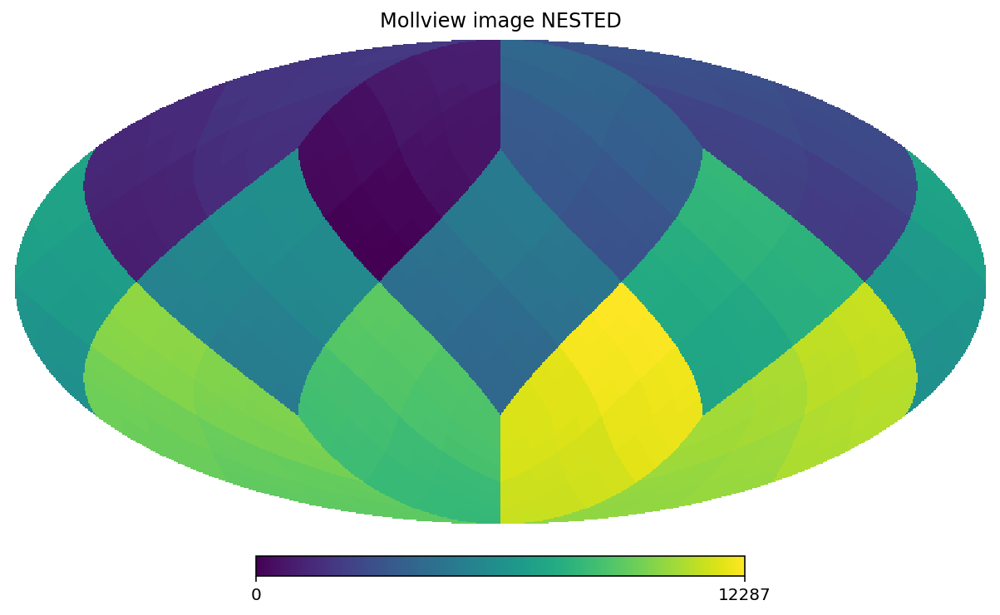

In [82]:
m = np.arange(NPIX)
hp.mollview(m, nest=True, title="Mollview image NESTED")

In [279]:
planck_map_30 = hp.read_map("../CMB_maps/LFI_SkyMap_030_1024_R2.01_full.fits")

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


In [281]:
planck_map_857 = hp.read_map("../CMB_maps/HFI_SkyMap_857_2048_R2.02_full.fits")

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/opt/anaconda3/lib/python3.7/site-packages/healpy/fitsfunc.py:372: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Ordering converted to RING


In [282]:
planck_map_30_downsamp = hp.pixelfunc.ud_grade(planck_map_30, 8, order_in='RING')

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


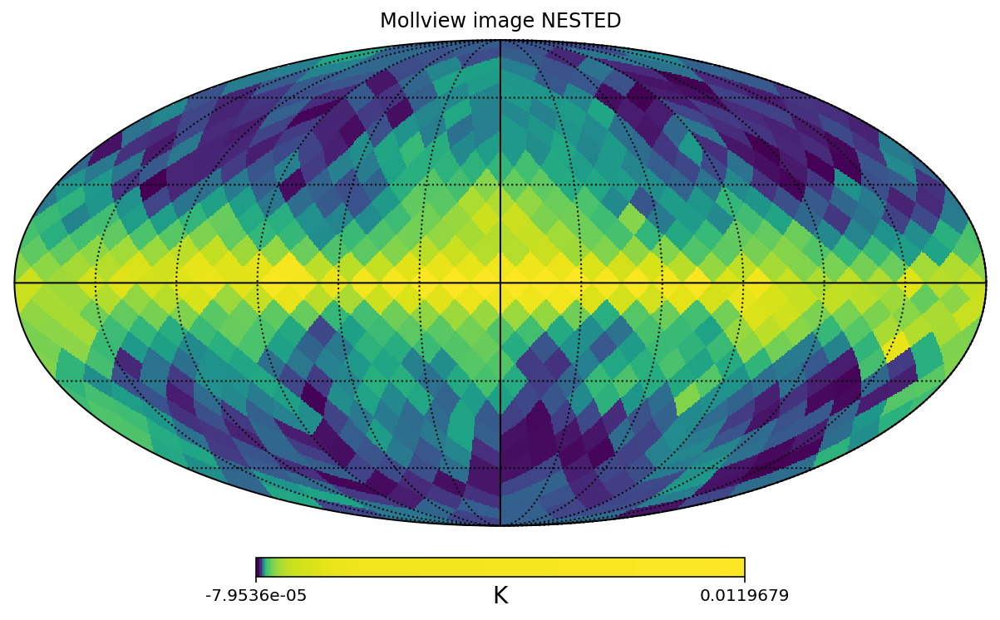

In [283]:
hp.mollview(
    planck_map_30_downsamp,
    unit="K",
    norm="hist",
    title="Mollview image NESTED",
    #min=-1,
    #max=1,
)
hp.graticule()

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


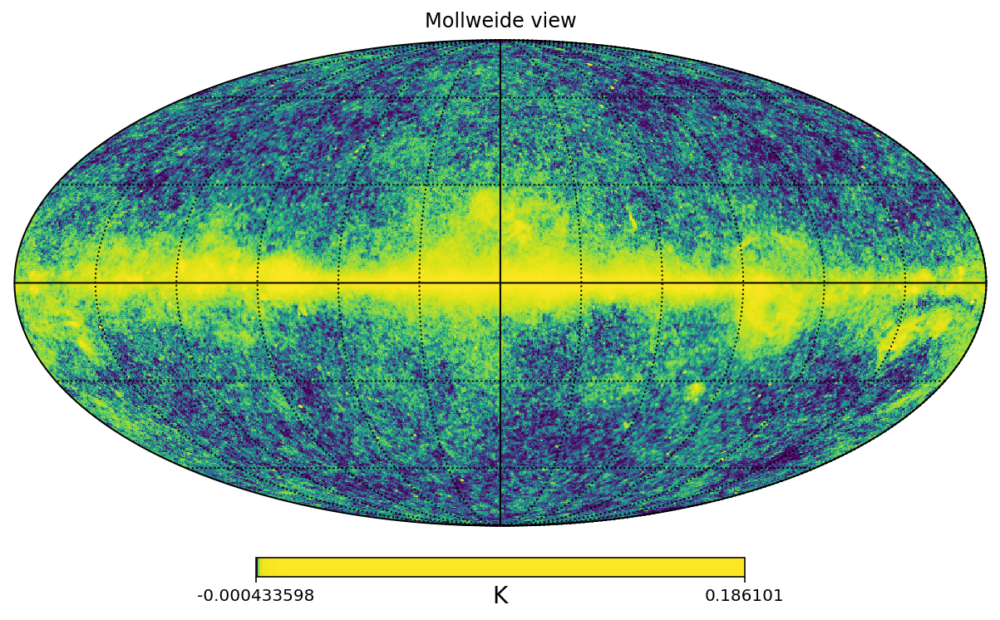

In [284]:
hp.mollview(
    planck_map_30,
    unit="K",
    norm="hist",
    #min=-1,
    #max=1,
)
hp.graticule()


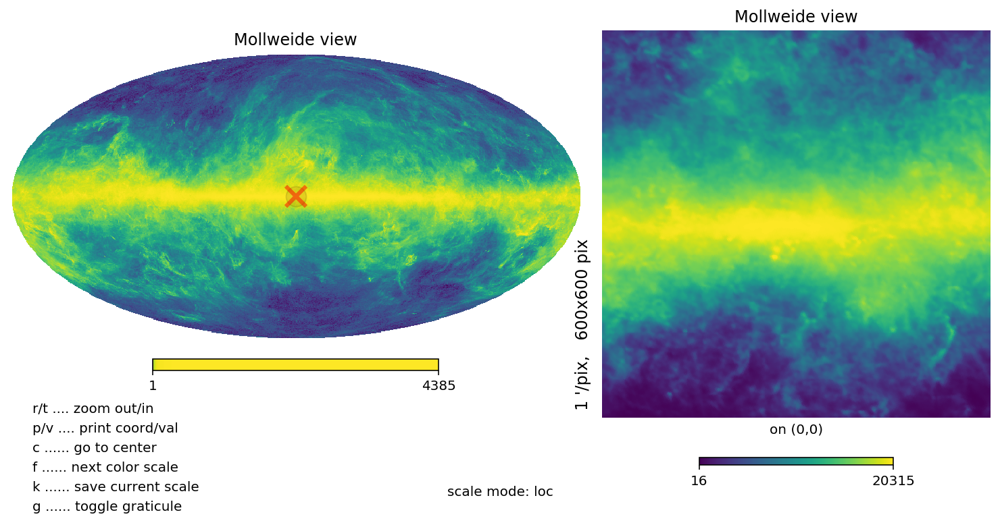

In [285]:
hp.mollzoom(map=planck_map_857, norm='hist')

In [85]:
LMAX = 1024
cl = hp.anafast(planck_map_30, lmax=LMAX)
ell = np.arange(len(cl))

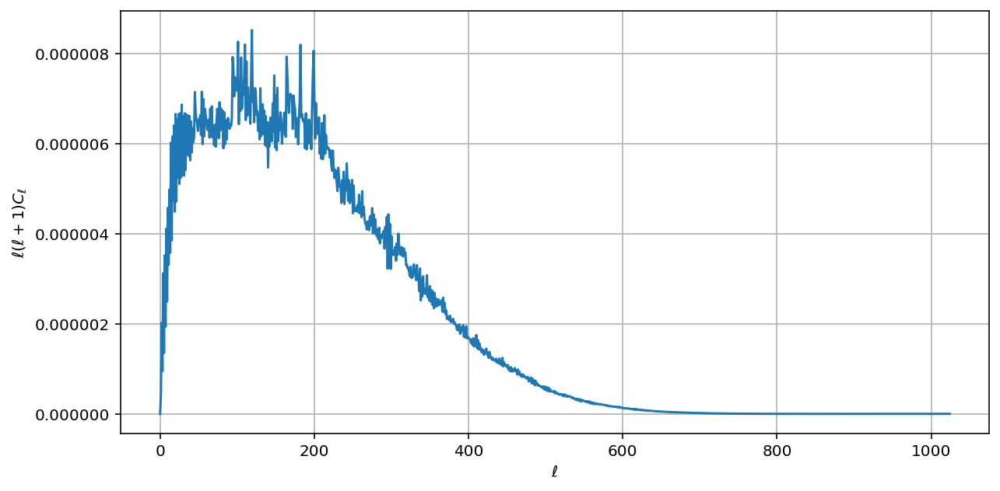

In [286]:
plt.figure(figsize=(10, 5))
plt.plot(ell, ell * (ell + 1) * cl)
plt.xlabel("$\ell$")
plt.ylabel("$\ell(\ell+1)C_{\ell}$")
plt.grid()
hp.write_cl("cl.fits", cl, overwrite=True)

In [287]:
CMB_map_names = ["LFI_SkyMap_030_1024_R2.01_full.fits",
"LFI_SkyMap_044_1024_R2.01_full.fits" ,
"LFI_SkyMap_070_1024_R2.01_full.fits",
"HFI_SkyMap_100_2048_R2.02_full.fits", 
"HFI_SkyMap_143_2048_R2.02_full.fits",
"HFI_SkyMap_217_2048_R2.02_full.fits", 
"HFI_SkyMap_353_2048_R2.02_full.fits", 
"HFI_SkyMap_545_2048_R2.02_full.fits", 
"HFI_SkyMap_857_2048_R2.02_full.fits",
];

In [294]:
CMB_maps = []
for i in CMB_map_names:
    
    temp = hp.read_map("../CMB_maps/%s"%(i))
    temp2 = hp.pixelfunc.ud_grade(temp, 512, order_in='RING')
    CMB_maps.append(temp2)
CMB_maps[7] = CMB_maps[7]*conv_factors[4] - 2.726
CMB_maps[8] = CMB_maps[8]*conv_factors[5] - 2.726

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


In [295]:
for i in CMB_maps:
    print(len(i))

3145728
3145728
3145728
3145728
3145728
3145728
3145728
3145728
3145728


0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The inter

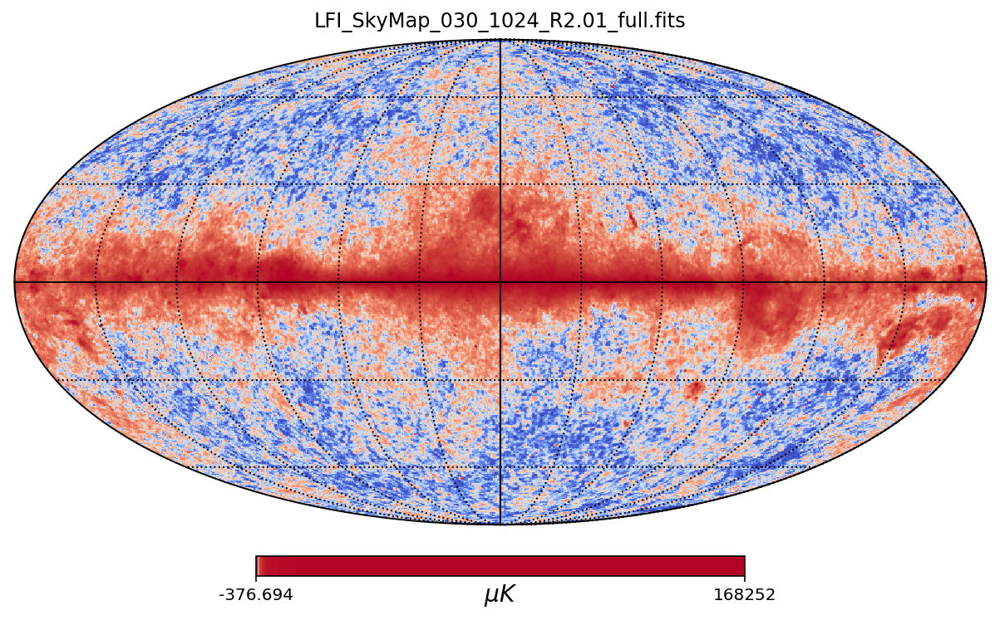

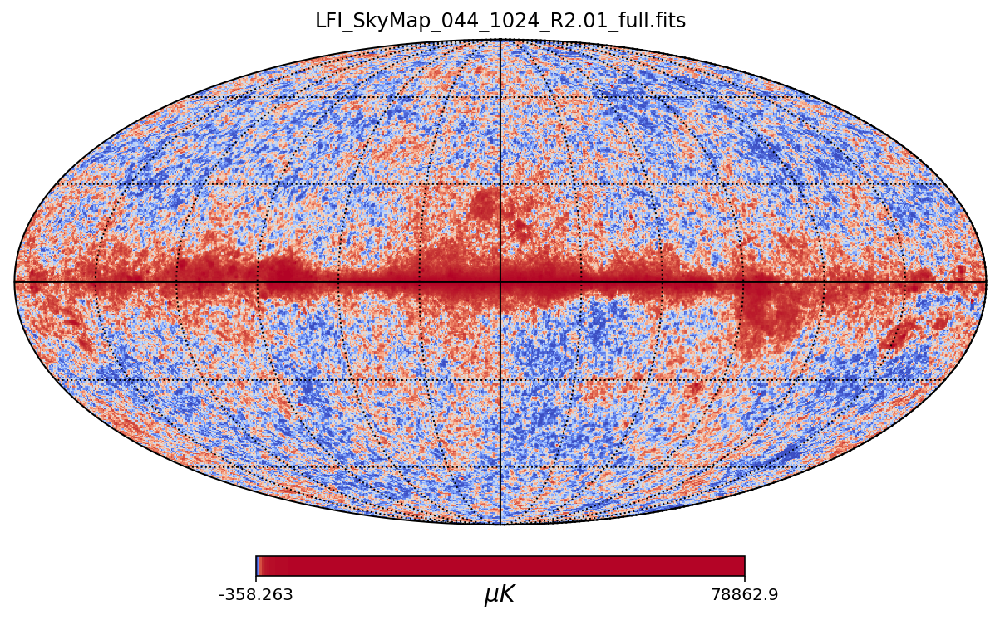

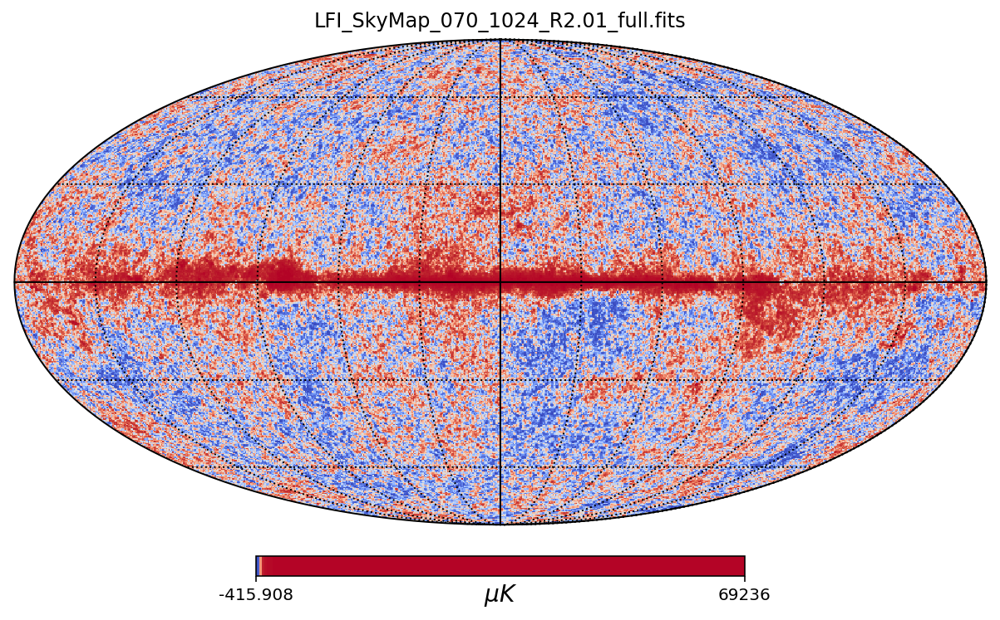

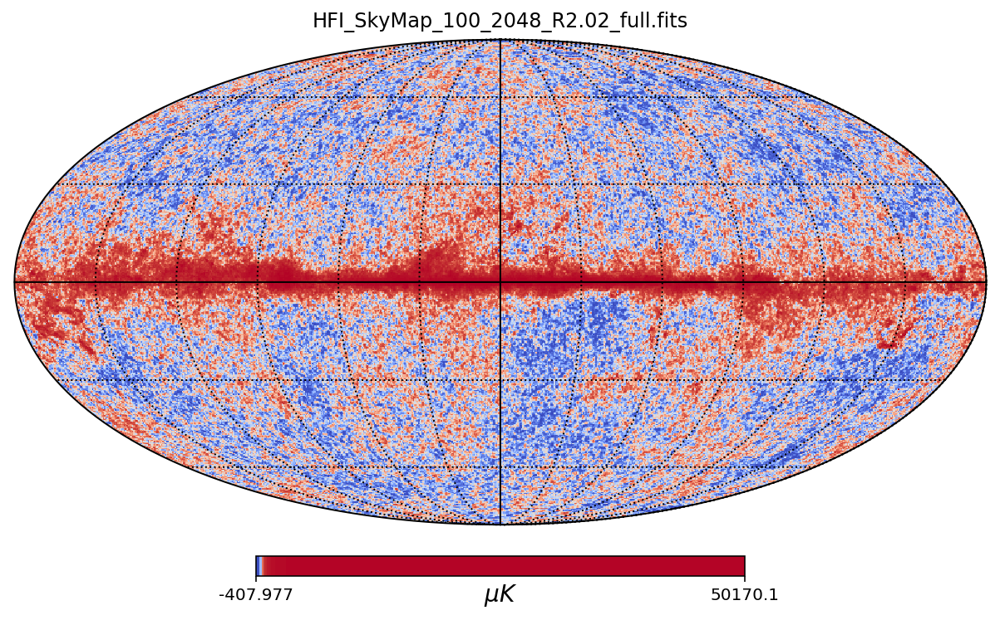

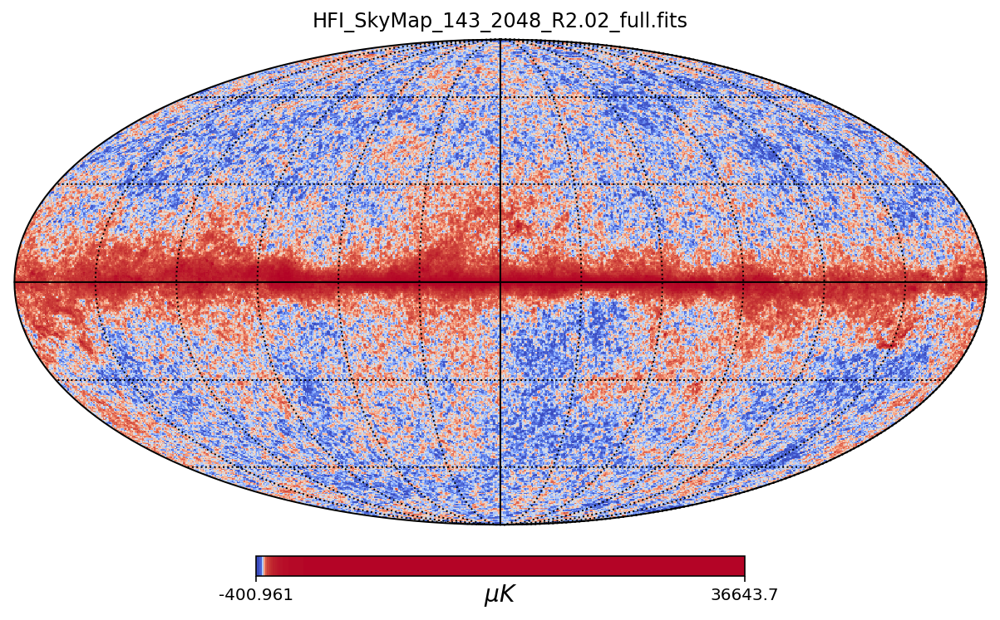

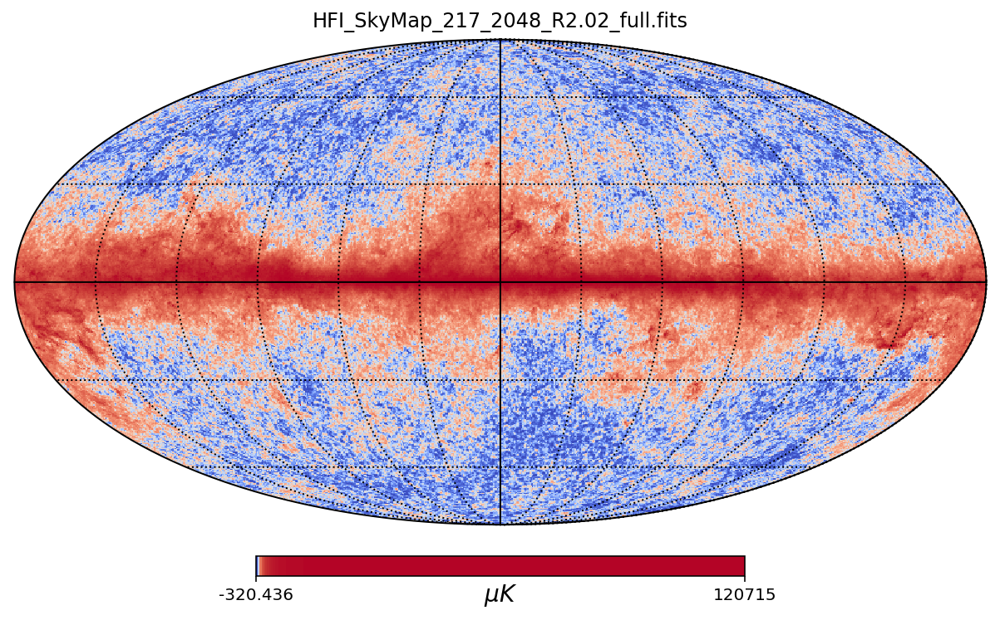

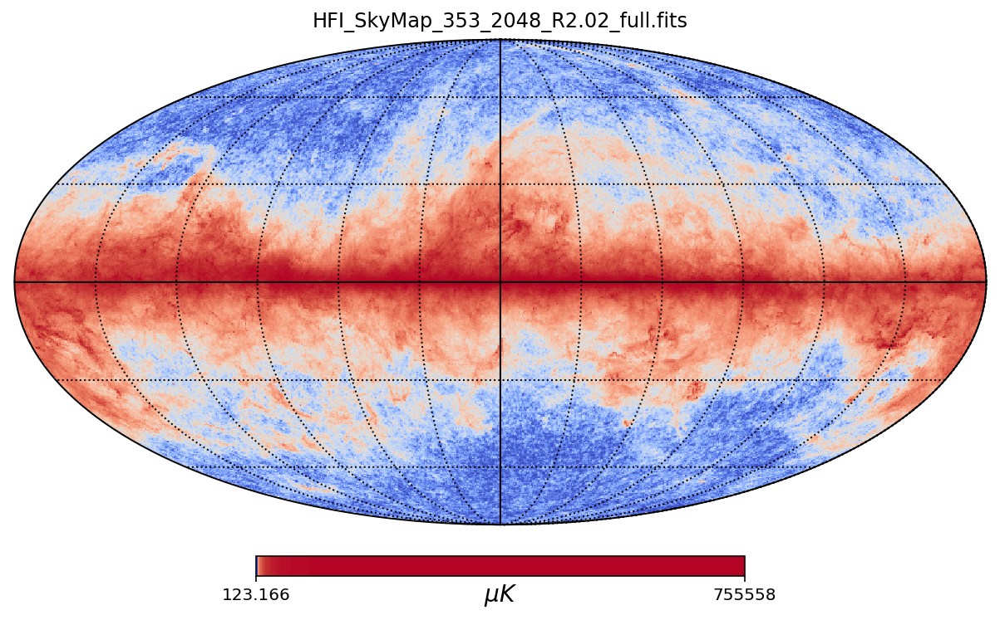

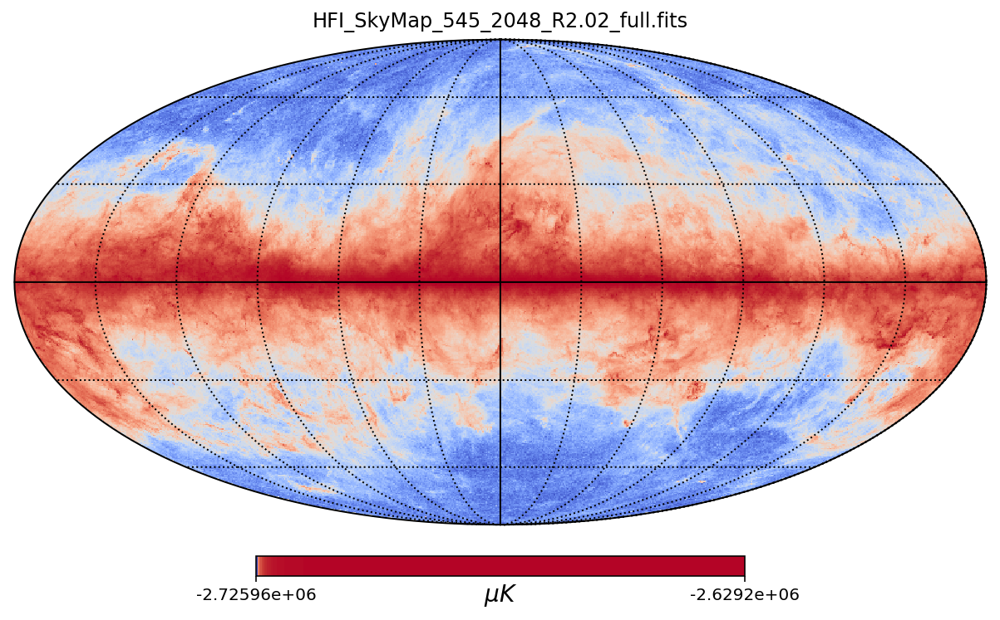

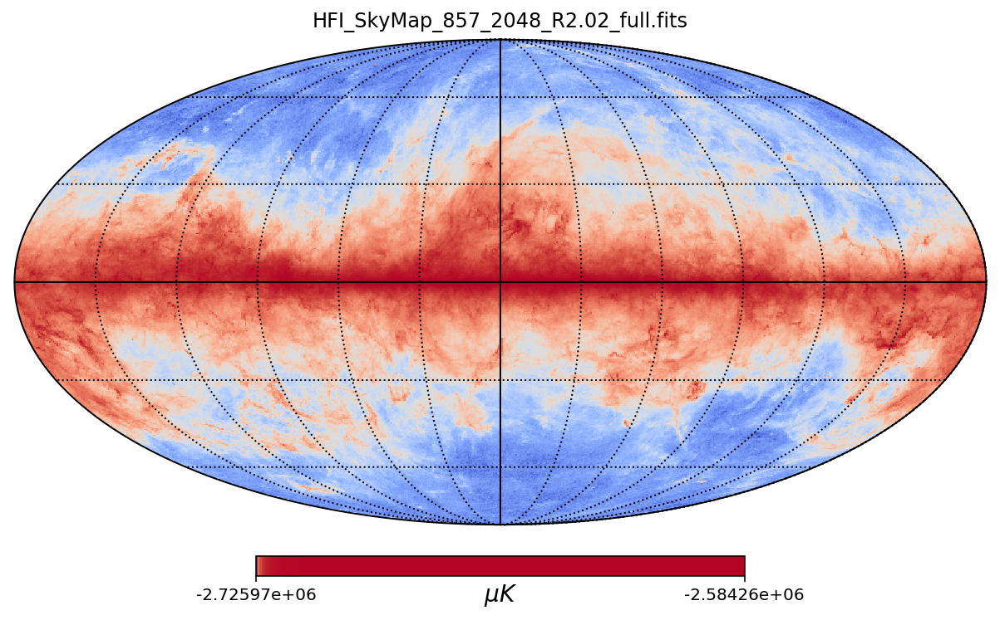

In [296]:
for i in range(len(CMB_maps)):
    hp.mollview(
        (10**6)*CMB_maps[i],
        unit=r"$\mu K$",
        norm="hist",
        title=CMB_map_names[i],
        cmap = 'coolwarm'
        #min=-1,
        #max=1,
    )
    hp.graticule()


In [107]:
#ordered according to increasing frequency for Planck CMB observations
conv_factors = [0.0032548074,0.0015916707 ,0.00069120334,0.00026120163, 0.00010958025,0.00004431631]

In [125]:
np.ones(10)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [129]:
np.logical_xor([True, False, True], [True, False, False])

array([False, False,  True])

In [175]:
mask_test = [[True, False, False],[False, True, False],[False, False, True]]

In [151]:
import functions_harper as hf

In [190]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[autoreload of functions_harper failed: Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/opt/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 434, in superreload
    module = reload(module)
  File "/opt/anaconda3/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/opt/anaconda3/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 724, in exec_module
  File "<frozen importlib._bootstrap_external>", line 860, in get_code
  File "<frozen importlib._bootstrap_external>", line 791, in source_to_code
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/Users/HarperSewalls/Desktop/Courses/Winter 2020/O

In [176]:
hf.test_masks(mask_test)

The masks each have exactly one True per position, so they are good.


In [182]:
a = np.array([1,2,3,4]);
a[np.array([True, False, True, False])]

array([1, 3])

In [187]:
if(not False):
    print('hi')

hi


In [194]:
hf.map_and_mask([1,2,3,4],[True,False,True,False])

[0, 2, 0, 4]

In [205]:
hf.recombine_maps([[1,2,3],[4,5,6]],[[True, False, False],[False, True, True]])

The masks partition the sky


array([4, 2, 3])

In [ ]:
# def of abs and rel tolerance np.absolute(m - badval) <= atol + rtol * np.absolute(badval)

In [ ]:
region= [[0.00001,0.00001],[2e-4,2e-4],[1e-6,1e-6]]
splitting(region, maps[3])

In [258]:
np.sum(hf.weight_freqs(np.array([2,-1,3]), np.array([[1,1,2],[2,2,2],[3,3,3]])),axis=0)

array([ 9,  9, 11])

In [259]:
hf.weight_freqs(np.array([2,-1,3]), np.array([[1,1,2],[2,2,2],[3,3,3]]))

[array([2, 2, 4]), array([-2, -2, -2]), array([9, 9, 9])]

In [242]:
?np.product

In [264]:
m = np.arange(12.)
m[5:] = hp.UNSEEN
print(m)
hp.mask_bad(m)

[ 0.0000e+00  1.0000e+00  2.0000e+00  3.0000e+00  4.0000e+00 -1.6375e+30
 -1.6375e+30 -1.6375e+30 -1.6375e+30 -1.6375e+30 -1.6375e+30 -1.6375e+30]


array([False, False, False, False, False,  True,  True,  True,  True,
        True,  True,  True])

In [278]:
hf.mask_outside_of_interval([0,np.inf],[1.0,0.5,0.0,-1.0,2.0])

[1.0, 0.5, 0.0, -1.0, 2.0]


[1.0, 0.5, -1.6375e+30, -1.6375e+30, 2.0]

In [27]:
#function to compute weights

#takes a list of temperature regions, one for each frequency being used for weight computation
def weighty_function(freq_temps):
    #making matrix
    n = len(freq_temps)
    
    H = np.ones((n,n))
    
    for i in range(n):
        for j in range(i,n-i):
            H[i][j] = np.sum(freq_temps[i]*freq_temps[j])
            if(not (i==j)):
                H[j][i] = H[i][j]
            
    
    Hinv = np.linalg.inv(H)
    print(H,"\n" ,Hinv)
    unit_vec = np.ones(n)
    weights = (Hinv @ unit_vec)/(np.transpose(unit_vec) @ Hinv @ unit_vec )
    return(weights)
    

In [28]:
weighty_function([np.array([1,-3,3]),np.array([1,3,3]),np.array([1,5,3])])

[[19.  1. -5.]
 [ 1. 19.  1.]
 [-5.  1.  1.]] 
 [[-0.125       0.04166667 -0.66666667]
 [ 0.04166667  0.04166667  0.16666667]
 [-0.66666667  0.16666667 -2.5       ]]


array([ 0.21428571, -0.07142857,  0.85714286])

In [16]:
np.array(range(3,10))

array([3, 4, 5, 6, 7, 8, 9])